In [1]:
# %%capture
# !pip install --quiet imutils
# !pip install --quiet wget
# !pip install --quiet split-folders
# !pip install --quiet timm
# !pip install --quiet pytorch-lightning
# !pip install --quiet torchmetrics
# !pip install --quiet rich

In [2]:
# %pip install imutils
# %pip install split-folders
# %pip install torchmetrics
# %pip install timm
# %pip install wget
# %pip install pytorch_lightning
# %pip install tensorflow

In [3]:
from imutils import paths
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import torch
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import splitfolders
from torch import nn
import numpy as np
import os
import torchmetrics
import timm
import wget
import pytorch_lightning as pl
from pytorch_lightning import Trainer
import cv2
import tensorflow as tf
from pytorch_lightning import seed_everything
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning import Trainer
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

In [4]:
# _URL = 'http://image.ntua.gr/iva/datasets/flickr_logos/flickr_logos_27_dataset.tar.gz'
# wget.download(_URL)

In [5]:
!ls

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [6]:
# zip_dir = tf.keras.utils.get_file('./logo', origin=_URL, untar=True,extract=True)

In [7]:
import tarfile

fname = 'flickr_logos_27_dataset.tar.gz'

if fname.endswith("tar.gz"):
    tar = tarfile.open(fname, "r:gz")
    tar.extractall()
    tar.close()

In [8]:
fname = 'flickr_logos_27_dataset/flickr_logos_27_dataset_images.tar.gz'

if fname.endswith("tar.gz"):
    tar = tarfile.open(fname, "r:gz")
    tar.extractall()
    tar.close()

In [9]:
src_dir = "flickr_logos_27_dataset_images"
dest = "LOGOS"

if not os.path.exists(dest):
    os.makedirs(dest)

PRE-PROCESSING


In [10]:
import pandas as pd

In [11]:
df = pd.read_csv("flickr_logos_27_dataset/flickr_logos_27_dataset_training_set_annotation.txt", sep='\s+',header=None)
df

,0,1,2,3,4,5,6
0,144503924.jpg,Adidas,1,38,12,234,142
1,2451569770.jpg,Adidas,1,242,208,413,331
2,390321909.jpg,Adidas,1,13,5,89,60
3,4761260517.jpg,Adidas,1,43,122,358,354
4,4763210295.jpg,Adidas,1,83,63,130,93
...,...,...,...,...,...,...,...
4531,2126991906.jpg,Yahoo,6,15,6,253,54
4532,217288720.jpg,Yahoo,6,136,161,304,222
4533,2472817996.jpg,Yahoo,6,2,4,499,106
4534,2514220918.jpg,Yahoo,6,1,69,342,157


In [12]:
X = df.iloc[:,0] ## Image Names
Y = df.iloc[:,1] ## Class Names

In [13]:
dtdir = './flickr_logos_27_dataset_images/'
len(dtdir)

33

In [14]:
im = df[0][1500]
im


'165691999.jpg'

In [15]:
size = df.iloc[:,3:] ## Co-ordinates of Images
size = size.values.tolist()
len(size)

4536

In [16]:
img = os.path.join(dtdir,im)
img

'./flickr_logos_27_dataset_images/165691999.jpg'

(378, 500, 3)

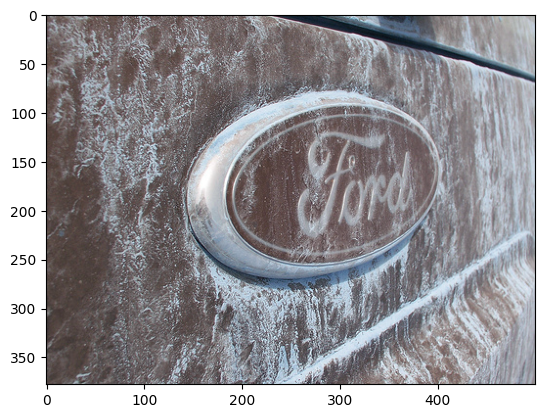

In [17]:
image = cv2.imread(img)
plt.imshow(image)
image.shape

In [18]:
query = pd.read_csv("./flickr_logos_27_dataset/flickr_logos_27_dataset_query_set_annotation.txt", sep='\s+',header=None)
query

,0,1
0,2403695909.jpg,Adidas
1,2912587920.jpg,Adidas
2,3441398196.jpg,Adidas
3,4605630935.jpg,Adidas
4,4606245138.jpg,Adidas
...,...,...
265,3480640208.jpg,none
266,3486224308.jpg,none
267,3486430785.jpg,none
268,3490185235.jpg,none


(500, 500, 3)

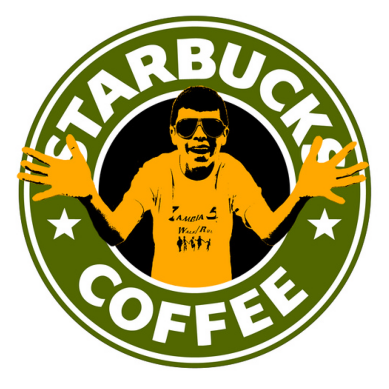

In [19]:
img = os.path.join(dtdir,query[0][100])
image = cv2.imread(img)
plt.imshow(image)
plt.axis("off")
image.shape

In [20]:
y = list(set(list(Y)))
y.sort()

In [21]:
for i in y:
    if(not os.path.isdir(os.path.join(dest,i))):
        os.makedirs(os.path.join(dest,i))

In [22]:
distractor = pd.read_csv("./flickr_logos_27_dataset/flickr_logos_27_dataset_distractor_set_urls.txt", sep='\s+',header=None)
distractor

,0
0,http://farm2.static.flickr.com/1184/1013364004...
1,http://farm2.static.flickr.com/1108/1047095104...
2,http://farm2.static.flickr.com/1359/1076885577...
3,http://farm1.static.flickr.com/53/110432189_6d...
4,http://farm2.static.flickr.com/1144/1153048029...
...,...
4202,http://farm2.static.flickr.com/1254/889763557_...
4203,http://farm2.static.flickr.com/1308/901063602_...
4204,http://farm1.static.flickr.com/18/93551127_fed...
4205,http://farm2.static.flickr.com/1033/978252884_...


In [23]:
HEIGHT = 224
WIDTH =  224

REMOVING CORRUPT IMAGES

In [24]:
for i in range(len(X)):
    try:
        destrain = os.path.join(dest,Y[i])
        savepath = os.path.join(destrain,X[i])
        img  = os.path.join(dtdir,X[i])
        image = cv2.imread(img)
        image = image[size[i][1]:size[i][3],size[i][0]:size[i][2]]
        image = cv2.resize(image,(WIDTH,HEIGHT))
        cv2.imwrite(savepath,image)
    except:
        print(savepath)
        print('error')
        pass

LOGOS\RedBull\2662264721.jpg
error
LOGOS\RedBull\2662264721.jpg
error
LOGOS\RedBull\2662264721.jpg
error
LOGOS\RedBull\2662264721.jpg
error
LOGOS\RedBull\2662264721.jpg
error


In [25]:
A = query.iloc[:,0]
B = query.iloc[:,1]

In [26]:
for i in range(len(A)):
    try:
        destrain = os.path.join(dest,B[i])
        savepath = os.path.join(destrain,A[i])
        img  = os.path.join(dtdir,A[i])
        image = cv2.imread(img)
        image = cv2.resize(image,(WIDTH,HEIGHT))
        cv2.imwrite(savepath,image)
    except:
        print('error')
        pass


In [48]:
imagePaths = list(paths.list_images(dest))

LOGOS\Cocacola\2435838064.jpg


(224, 224, 3)

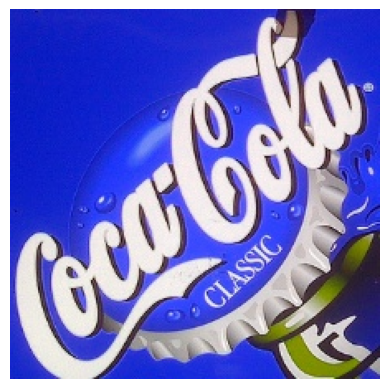

In [28]:
img = imagePaths[150]
print(img)
image = cv2.imread(img)
plt.imshow(image)
plt.axis("off")
image.shape

TRAIN VAL SPLIT

In [29]:
path = 'LOGOS'

In [30]:
splitfolders.ratio(path, output="data", seed=42, ratio=(0.8,0.2))

Copying files: 944 files [00:04, 193.79 files/s]


IMAGE AUGMENTATION

In [31]:
# initialize our data augmentation functions
resize = transforms.Resize(size=(WIDTH,HEIGHT))
hFlip = transforms.RandomHorizontalFlip(p=0.25)
vFlip = transforms.RandomVerticalFlip(p=0.25)
rotate = transforms.RandomRotation(degrees=15)
coljtr = transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.1)
raf = transforms.RandomAffine(degrees=40, translate=None, scale=(1, 2), shear=15)
rrsc = transforms.RandomResizedCrop(size=WIDTH, scale=(0.8, 1.0))
ccp  = transforms.CenterCrop(size=WIDTH)  # Image net standards
nrml = transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])  # Imagenet standards

In [32]:
# initialize our training and validation set data augmentation
# pipeline
trainTransforms = transforms.Compose([resize,hFlip,vFlip,rotate,raf,rrsc,ccp,coljtr,transforms.ToTensor(),nrml])
valTransforms = transforms.Compose([resize,transforms.ToTensor(),nrml])

In [33]:
BS = 256
# initialize the training and validation dataset
print("[INFO] loading the training and validation dataset...")
trainDataset = ImageFolder(root='./data/train',transform=trainTransforms)
valDataset = ImageFolder(root='./data/val', transform=valTransforms)
print("[INFO] training dataset contains {} samples...".format(len(trainDataset)))
print("[INFO] validation dataset contains {} samples...".format(len(valDataset)))

[INFO] loading the training and validation dataset...
[INFO] training dataset contains 755 samples...
[INFO] validation dataset contains 189 samples...


In [34]:
class LitNeuralNet(pl.LightningModule):
    def __init__(self,num_classes):
        super(LitNeuralNet, self).__init__()
        
        
        self.model = timm.create_model('efficientnet_b0', pretrained=True)
        self.model.aux_logits=False

        # Freeze training for all layers
        for param in self.model.parameters():
            param.requires_grad = False
        
        self.model.classifier = nn.Sequential(
                      nn.Linear(self.model.classifier.in_features, 512), 
                      nn.BatchNorm1d(512),
                      nn.Dropout(0.4),
                      nn.ReLU(inplace=True),
                      nn.Linear(512, 256), 
                      nn.BatchNorm1d(256),
                      nn.Dropout(0.4),
                      nn.ReLU(inplace=True),
                      nn.Linear(256, num_classes),
                      nn.Softmax())
        # add metrics
        self.acc = torchmetrics.Accuracy(task="multiclass",num_classes=num_classes)
        
    def forward(self, x):
        out = self.model(x)
        return out

    def train_dataloader(self):
        trainDataLoader = DataLoader(trainDataset, num_workers=8,batch_size=BS, shuffle=True)

        return trainDataLoader

    def val_dataloader(self):
        valDataLoader = DataLoader(valDataset, num_workers=8,batch_size=BS,shuffle=False)
        
        return valDataLoader

    def training_step(self, batch, batch_idx):
        images, labels = batch
        # Forward pass
        outputs = self.forward(images)
        lossfn = nn.CrossEntropyLoss()
        loss = lossfn(outputs, labels)
        
        #y_pred = torch.exp(outputs)
        y_pred = torch.argmax(outputs,dim=1)
        #y_pred = output.data.max(1, keepdim=True)[1]
        train_acc = self.acc(y_pred, labels)
        # just accumulate

        self.log("train_loss", loss)
        self.log("train_accuracy", train_acc)
        tensorboard_logs = {'train_loss': loss}
        # use key 'log'
        return {"loss": loss, 'log': tensorboard_logs}
    
    
    def validation_step(self, batch, batch_idx):
        images, labels = batch
        # Forward pass
        outputs = self.forward(images)
        lossfn = nn.CrossEntropyLoss()   
        loss = lossfn(outputs, labels)
        
        #pred = torch.exp(outputs)
        y_pred = torch.argmax(outputs,dim=1)
        #pred = output.data.max(1, keepdim=True)[1]
        self.acc.update(y_pred, labels)

        self.log("val_loss", loss)
        return {"val_loss": loss}
            
    def validation_epoch_end(self, outputs):
        # outputs = list of dictionaries
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        val_accuracy = self.acc.compute()
        # log metrics
        self.log("val_accuracy", val_accuracy)
        self.log("val_loss", avg_loss)
        # reset all metrics
        self.acc.reset()
        print(f"\nVal Accuracy: {val_accuracy:.4} "\
        f"Val Loss: {avg_loss:.4}")
        
        tensorboard_logs = {'avg_val_loss': avg_loss}
        # use key 'log'
        return {'val_loss': avg_loss, 'log': tensorboard_logs}
    
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters())

In [35]:
# seeding for torch, numpy, stdlib random, including DataLoader workers!
seed_everything(123, workers=True)

early_stopping = EarlyStopping(
    monitor="val_loss",
    stopping_threshold=1e-5,
    divergence_threshold=9.0,
    check_finite=True)

Global seed set to 123


In [36]:
import torch
print(torch.cuda.is_available())
# %pip install torch --extra-index-url https://download.pytorch.org/whl/cu116.

False


In [37]:
# model = LitNeuralNet(num_classes=len(trainDataset.classes))
# trainer = Trainer(accelerator='cpu', devices=1,max_epochs=150,log_every_n_steps=3)#,callbacks=[early_stopping])
# trainer.fit(model)

LOADING THE MODEL

In [38]:
checkpoint_path = "lightning_logs/version_10/checkpoints/epoch=149-step=450.ckpt"

trainer = pl.Trainer()
model = LitNeuralNet.load_from_checkpoint(checkpoint_path,num_classes=len(trainDataset.classes))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


SAVING THE MODEL

In [39]:
%pip install pickle
import pickle

# save the model to disk
filename = 'finalized_model.sav'
pickle.dump(model, open(filename, 'wb'))

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement pickle (from versions: none)
ERROR: No matching distribution found for pickle

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [40]:
# filename = 'finalized_model.sav'


# # load the model from disk
# loaded_model = pickle.load(open(filename, 'rb'))

PREDICTION ON TEST IMAGES

In [41]:
testimage = list(paths.list_images('./flickr_logos_27_dataset_images'))
len(testimage)

1079

In [72]:
def predimg(path,expected_class):
    from PIL import Image
    image = Image.open(path)
    plt.imshow(image)
    plt.axis("off")
    plt.show() 
    model.eval()
    with torch.no_grad():
      img =  load_img(path)
      mean = [0.485, 0.456, 0.406] 
      std = [0.229, 0.224, 0.225]
      transform_norm = transforms.Compose([transforms.ToTensor(), 
      transforms.Resize((224,224)),transforms.Normalize(mean, std)])
      img_normalized = transform_norm(img).float()
      img_normalized = img_normalized.unsqueeze(0)
      img = torch.from_numpy(np.asarray(img)).permute(2, 0, 1)
      img = img_normalized#.to(device)
      img = DataLoader(img, num_workers=8,batch_size=BS,shuffle=False)
      output = trainer.predict(model,img)
      output = output[0][0]
      #print(output)
      index = output.data.cpu().numpy().argmax()
      result = list(np.around(output.data.cpu().numpy()*100,1))
      # print(result)
      if(trainDataset.classes[index] == expected_class):
        print("PREDICTED CLASS ACCURATELY = ",trainDataset.classes[index])
      else:
        print("PREDICTED CLASS MISMATHCED = ",trainDataset.classes[index])



        

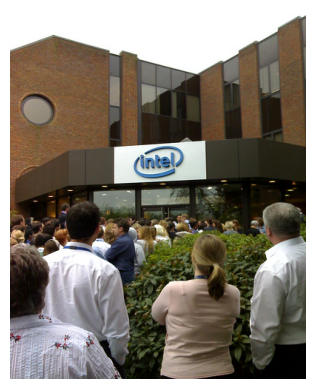

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Intel


In [74]:
predimg(testimage[36],"Intel")

In [44]:
# for image_path in testimage:
#     image = cv2.imread(image_path)
#     image = cv2.resize(image,(WIDTH,HEIGHT))
#     cv2.imwrite(image_path,image)
#     plt.imshow(image)
#     predimg(image_path)


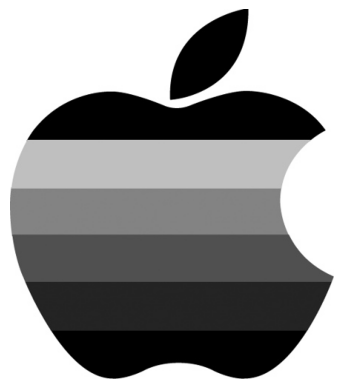

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Apple


In [73]:
predimg(testimage[45],"Apple")

Fedex
213783134.jpg


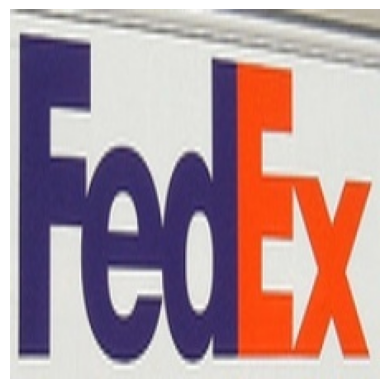

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Fedex
2286135438.jpg


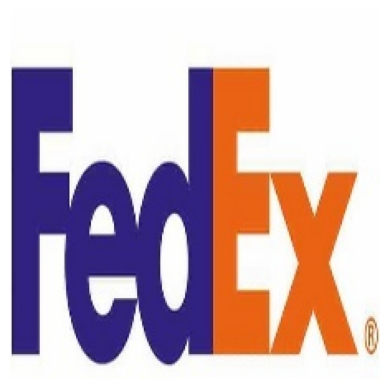

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Fedex
2459989055.jpg


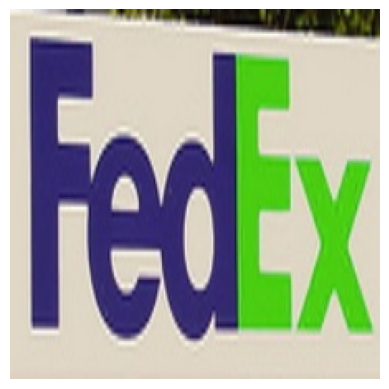

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Fedex
3325271357.jpg


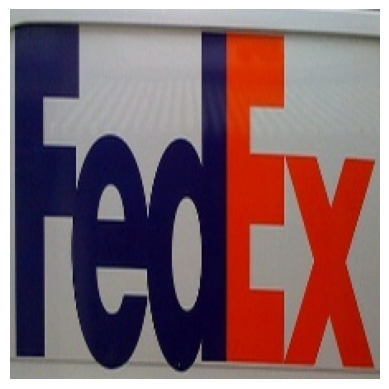

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Fedex
3428192889.jpg


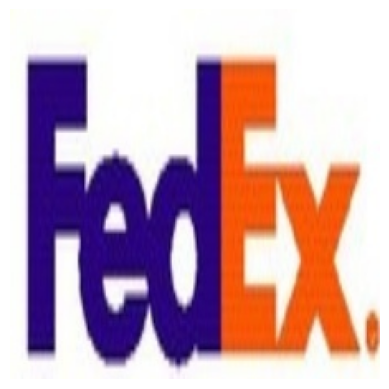

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Fedex
3777915073.jpg


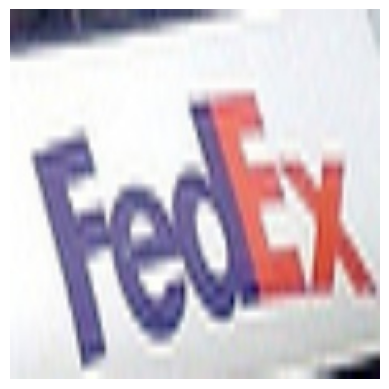

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Fedex
4749623965.jpg


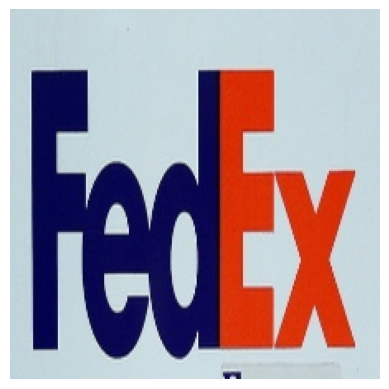

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Fedex


In [78]:
import cv2
imagepath = "./data/val/Fedex/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(images)
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




Adidas
13


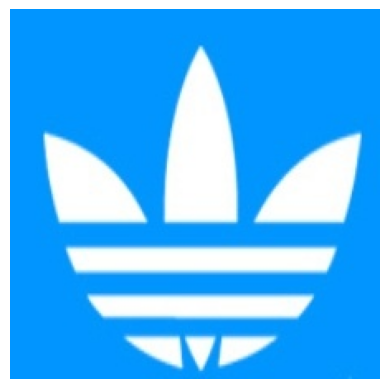

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Adidas
14


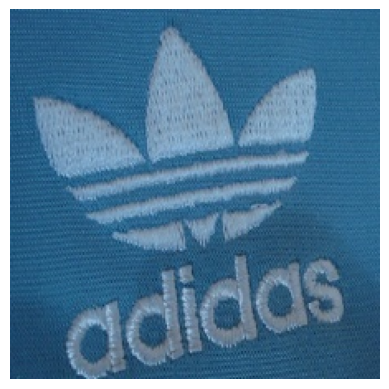

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Adidas
14


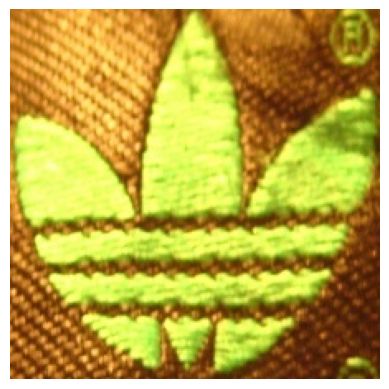

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Adidas
14


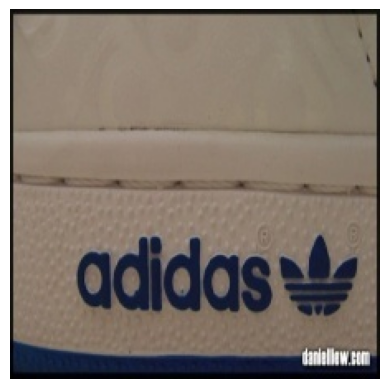

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Intel
14


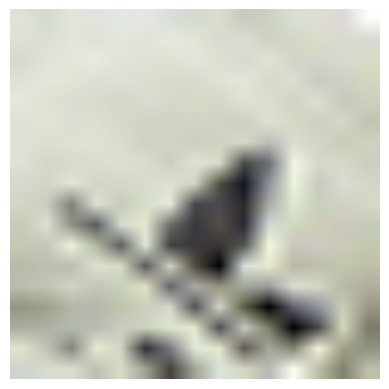

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Ferrari
14


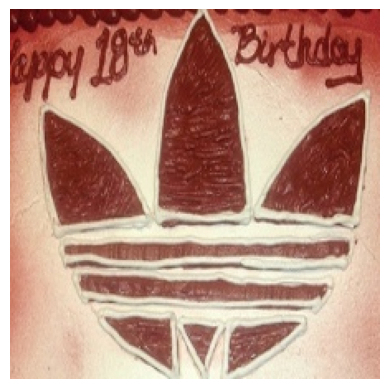

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Adidas
13


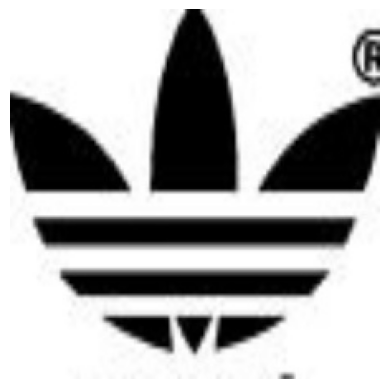

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Adidas


In [79]:
import cv2
imagepath = "./data/val/Adidas/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




Apple
14


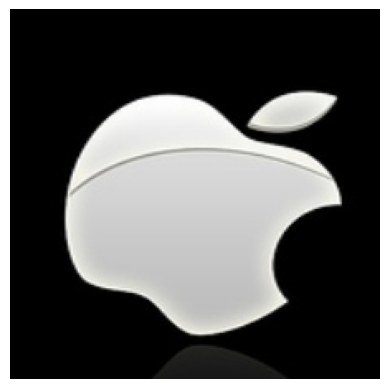

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Apple
14


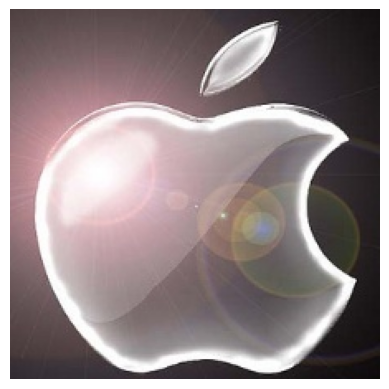

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Apple
14


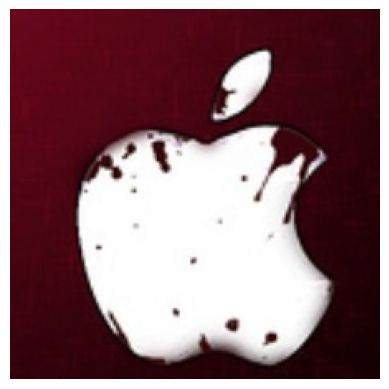

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Fedex
14


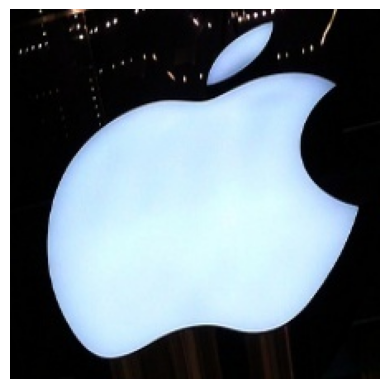

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Apple
13


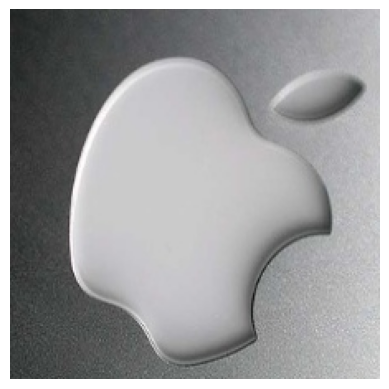

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Apple
14


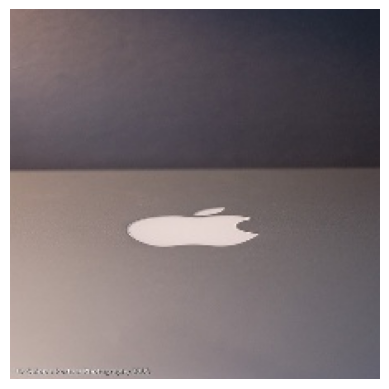

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Apple
12


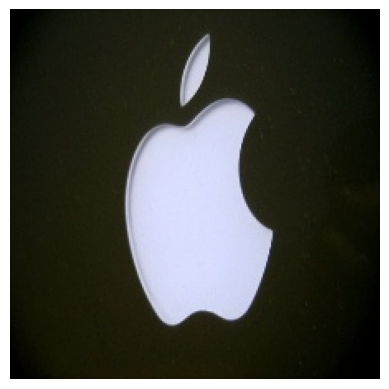

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Apple


In [80]:
import cv2
imagepath = "./data/val/Apple/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




BMW
14


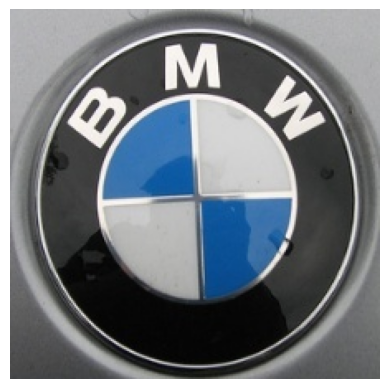

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  BMW
14


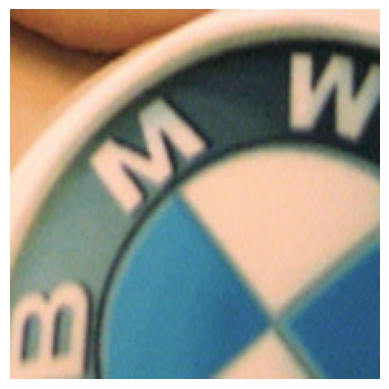

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Starbucks
14


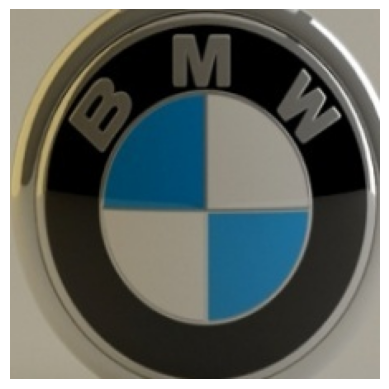

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  BMW
14


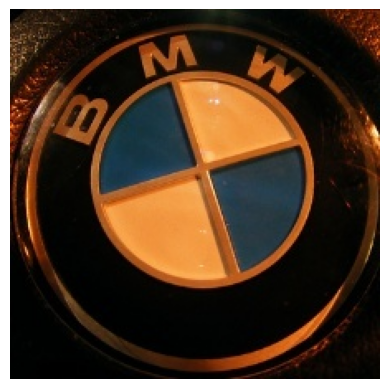

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  BMW
14


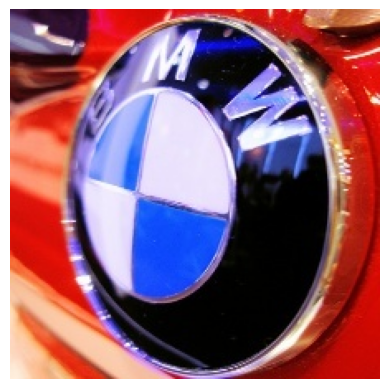

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  BMW
14


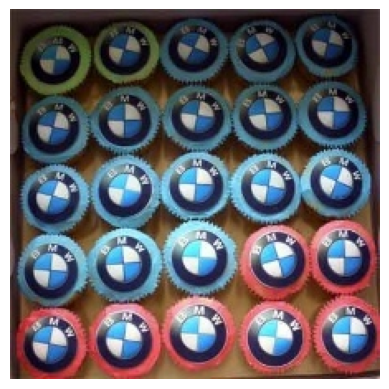

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Pepsi
14


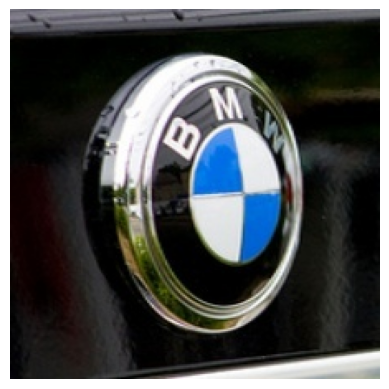

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Ford


In [81]:
import cv2
imagepath = "./data/val/BMW/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




Citroen
14


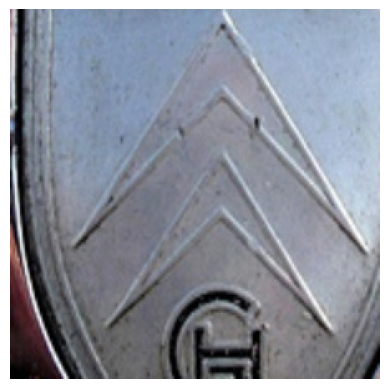

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Mini
14


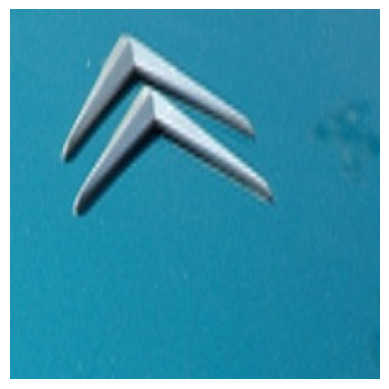

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Citroen
14


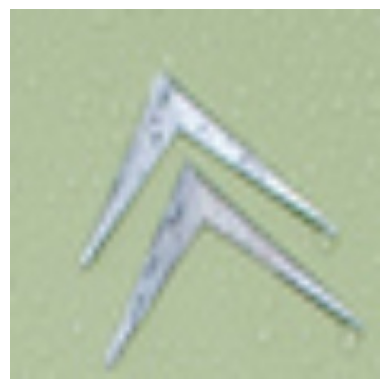

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Citroen
14


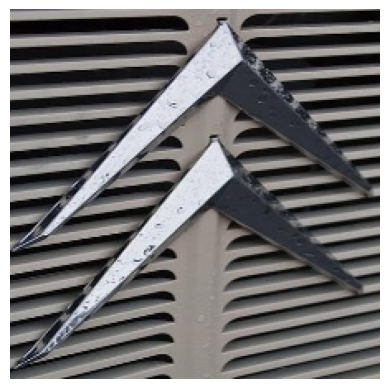

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Nike
14


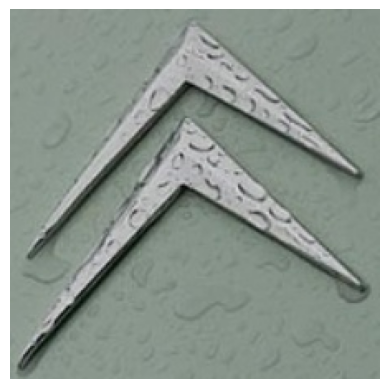

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Citroen
14


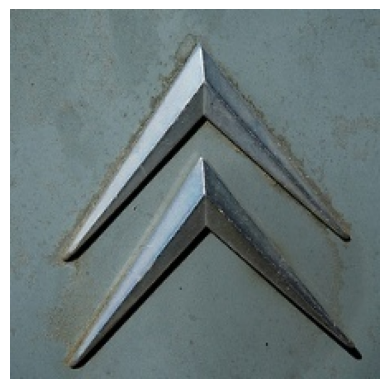

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Citroen
13


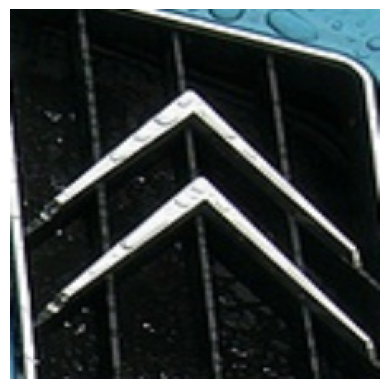

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Citroen


In [83]:
import cv2
imagepath = "./data/val/Citroen/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




Cocacola
13


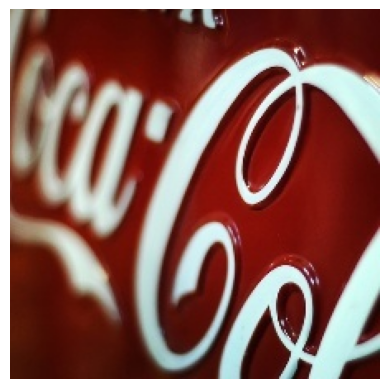

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Starbucks
12


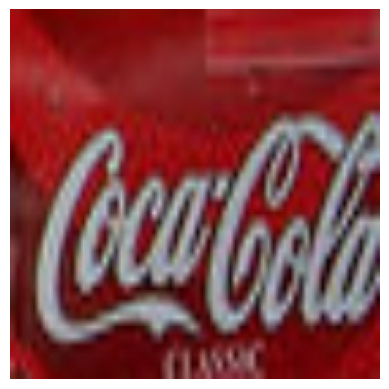

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Cocacola
14


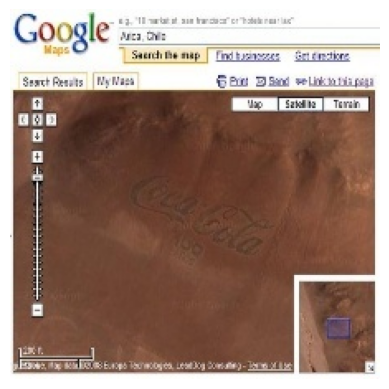

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Adidas
11


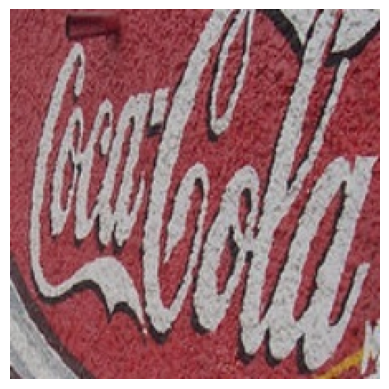

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Cocacola
14


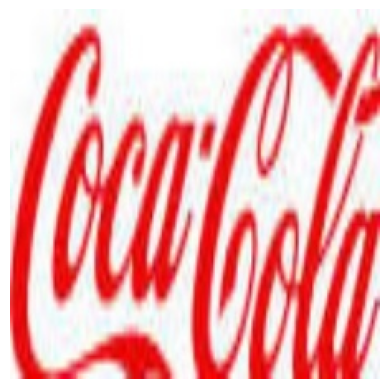

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Cocacola
13


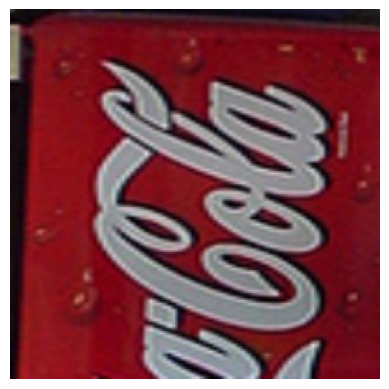

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Cocacola
12


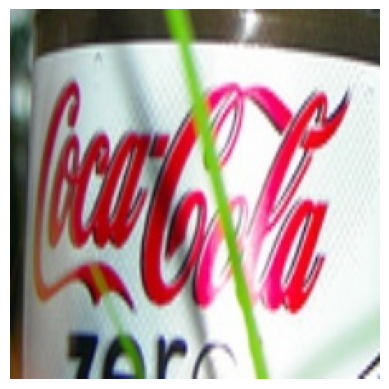

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  RedBull


In [84]:
import cv2
imagepath = "./data/val/Cocacola/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




DHL
14


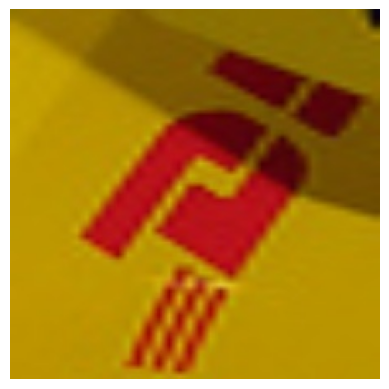

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  DHL
14


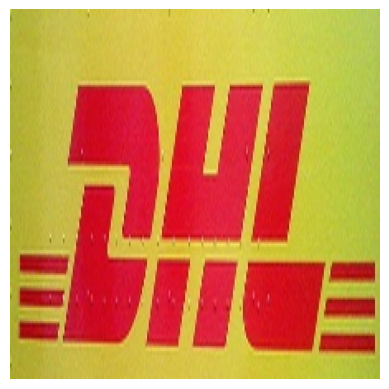

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  DHL
14


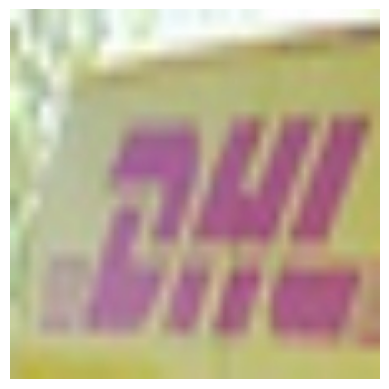

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  DHL
14


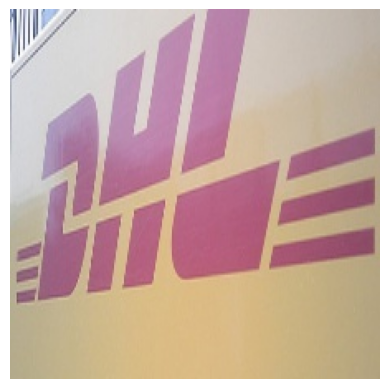

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  DHL
14


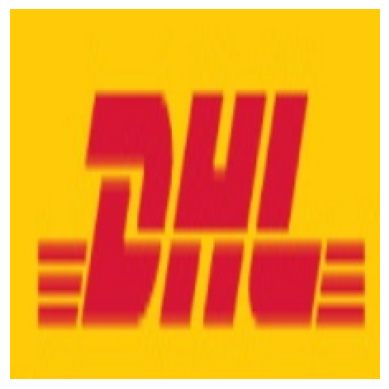

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  DHL
14


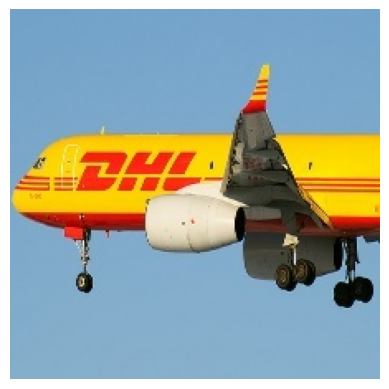

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Nike
12


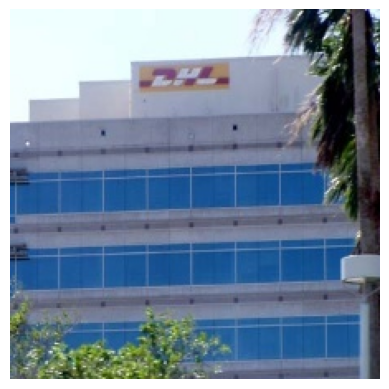

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Pepsi


In [85]:
import cv2
imagepath = "./data/val/DHL/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




Ferrari
14


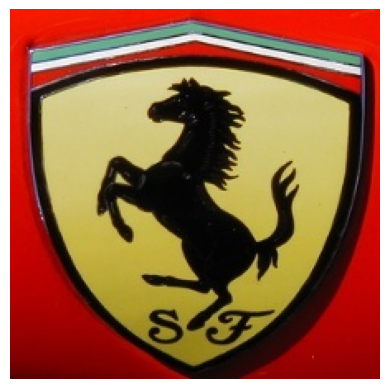

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ferrari
14


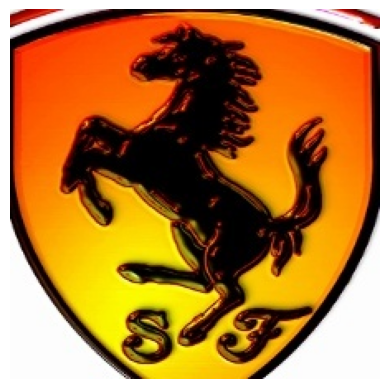

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ferrari
14


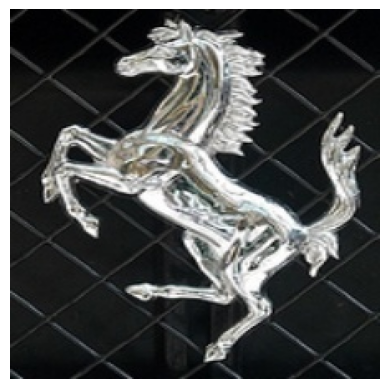

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ferrari
14


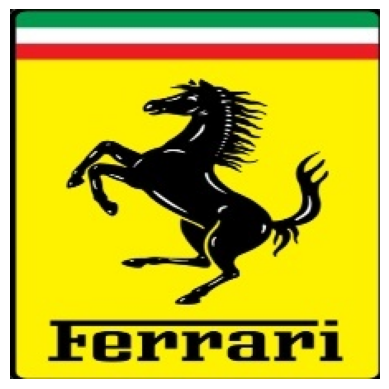

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ferrari
14


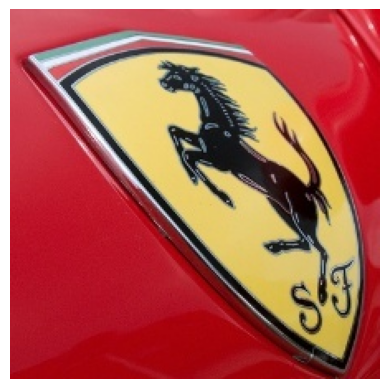

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ferrari
12


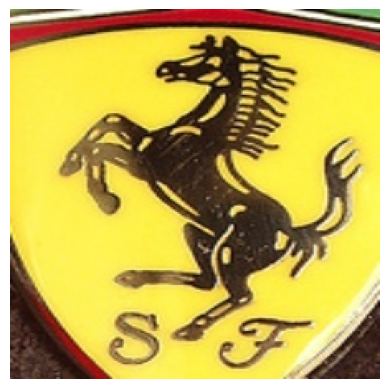

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ferrari
13


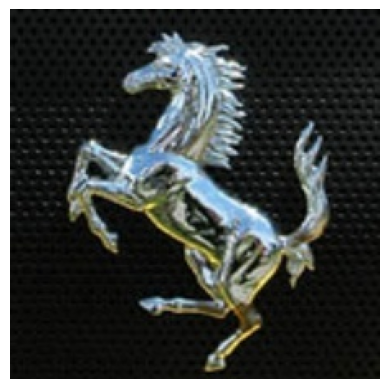

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ferrari


In [86]:
import cv2
imagepath = "./data/val/Ferrari/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




Ford
14


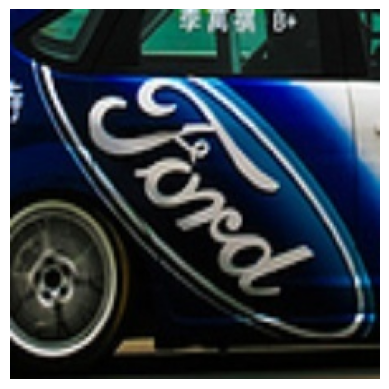

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Unicef
13


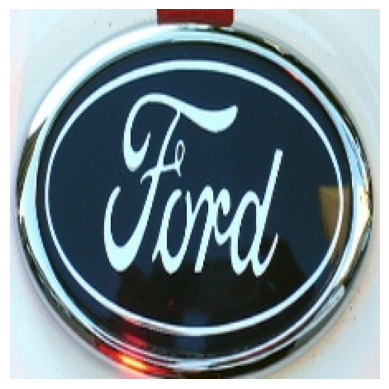

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ford
14


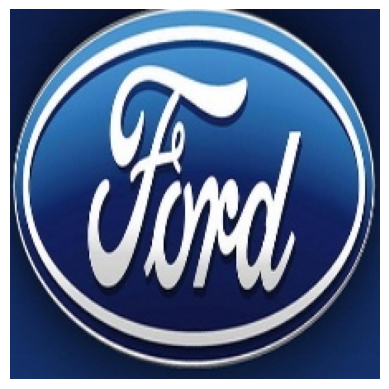

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ford
14


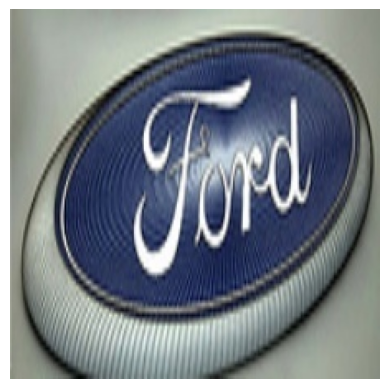

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ford
14


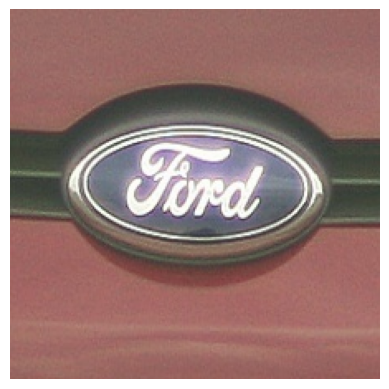

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS MISMATHCED =  Texaco
14


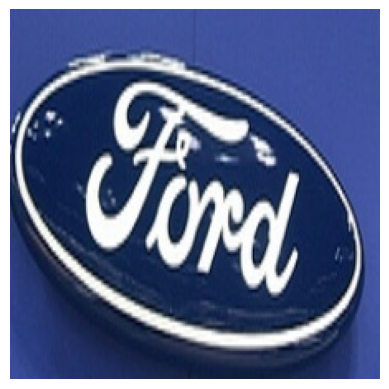

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ford
13


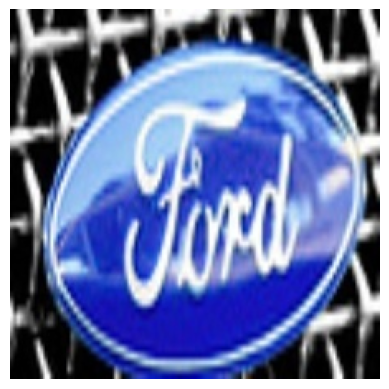

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Ford


In [87]:
import cv2
imagepath = "./data/val/Ford/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)




Google
14


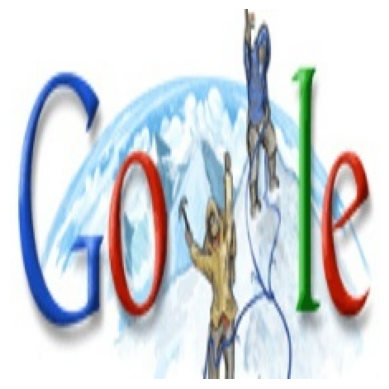

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Google
14


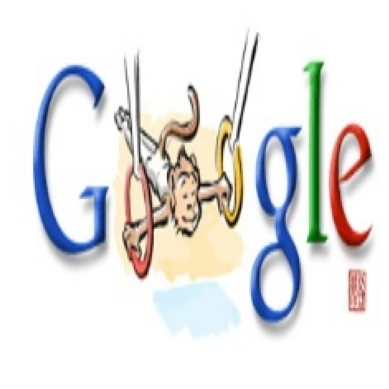

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Google
14


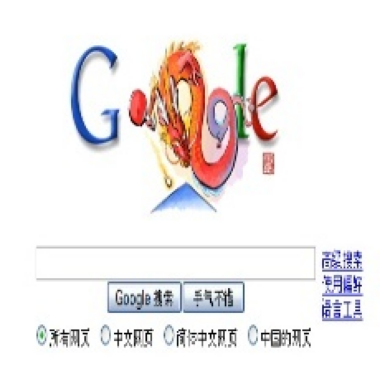

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Google
14


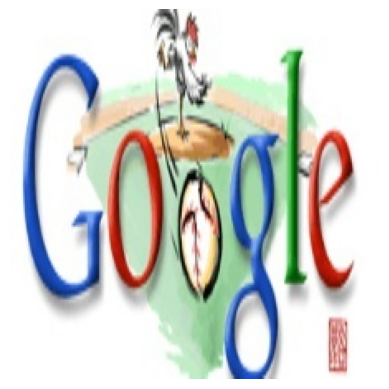

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Google
14


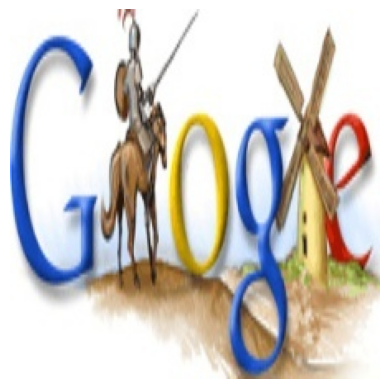

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Google
14


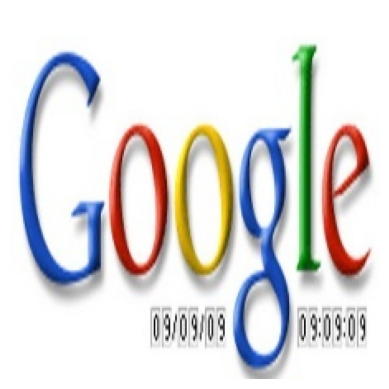

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Google
12


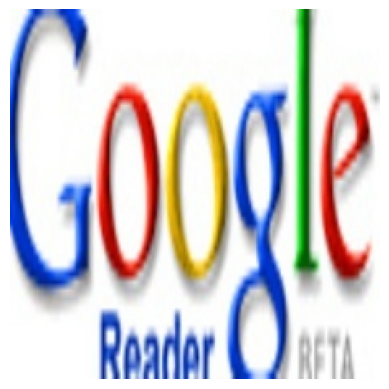

Predicting: 0it [00:00, ?it/s]

PREDICTED CLASS ACCURATELY =  Google


In [88]:
import cv2
imagepath = "./data/val/Google/"
expected_class = (os.path.split(os.path.split(imagepath)[0])[-1])
print((os.path.split(os.path.split(imagepath)[0])[-1]))
for images in os.listdir(imagepath):
    print(len(images))
    image = cv2.imread(imagepath+images)
    image = cv2.resize(image,(WIDTH,HEIGHT))
    cv2.imwrite("./test/"+(os.path.split(os.path.split(imagepath)[0])[-1])+".jpg",image)
    plt.imshow(image)
    predimg("./test/"+expected_class+".jpg",expected_class)


